In [1]:
# Import libraries
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity
import re
from skimage.feature import local_binary_pattern
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from itertools import product
import itertools
import math
from collections import Counter

In [2]:
all_images_dir = "/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images"
len_all_images_dir = len(all_images_dir)

In [3]:
def natural_sort_key(file_name):
    return [int(text) if text.isdigit() else text.lower() for text in re.split(r'(\d+)', file_name)]

In [4]:
def get_image_paths(dataset_path, bad_ids=[]):
    extensions = ('.jpg', '.png', '.jpeg')
    image_paths = []
    for root, _, files in os.walk(dataset_path):
        
        # Filter files by extensions
        sorted_files = sorted(
            (file for file in files if file.lower().endswith(extensions)),
            key=natural_sort_key
        )
        
        # Build image paths
        image_paths.extend(
            os.path.join(root, file) for file in sorted_files if file[:-4] not in bad_ids
        )
    return image_paths

# Re-fetch the paths
all_image_paths = get_image_paths(all_images_dir)


In [5]:
# Get a list of all image file paths
all_image_paths = get_image_paths(all_images_dir)
print(f'Total images: {len(all_image_paths)}')
print(all_image_paths[:5])
print(all_image_paths[-5:])

Total images: 45205
['/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/1163.jpg', '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/1164.jpg', '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/1165.jpg', '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/1525.jpg', '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/1526.jpg']
['/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/59995.jpg', '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/59996.jpg', '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/59998.jpg', '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/59999.jpg', '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/60000.jpg']


In [6]:
styles = pd.read_csv("augmented_styles.csv")

In [7]:
styles.head()

,Unnamed: 0,id,gender,masterCategory,subCategory,articleType,baseColour,usage
0,0,1163,Men,Apparel,Topwear,Tshirts,Blue,Sports
1,1,1164,Men,Apparel,Topwear,Tshirts,Blue,Sports
2,2,1165,Men,Apparel,Topwear,Tshirts,Blue,Sports
3,3,1525,Unisex,Accessories,Bags,Backpacks,Navy Blue,Casual
4,4,1526,Unisex,Accessories,Bags,Backpacks,Black,Sports


In [8]:
styles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38878 entries, 0 to 38877
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Unnamed: 0      38878 non-null  int64 
 1   id              38878 non-null  object
 2   gender          38878 non-null  object
 3   masterCategory  38878 non-null  object
 4   subCategory     38878 non-null  object
 5   articleType     38878 non-null  object
 6   baseColour      38878 non-null  object
 7   usage           38878 non-null  object
dtypes: int64(1), object(7)
memory usage: 2.4+ MB


In [9]:
# Extract the valid IDs from the styles DataFrame
valid_ids = set(styles["id"])

In [10]:
# Ensure `styles["id"]` is a string
styles["id"] = styles["id"].astype(str)

# Create a list of IDs from `styles`
styles_ids = styles["id"].to_list()

# Debug: Print some IDs from `styles`
print(f"Sample IDs from styles: {styles_ids[:5]}")

# Extract IDs from all_image_paths
def extract_id_from_path(image_path):
    return os.path.splitext(os.path.basename(image_path))[0]

# Extract IDs from all_image_paths and print them
all_image_ids = [extract_id_from_path(path) for path in all_image_paths]
print(f"Sample IDs from all_image_paths: {all_image_ids[:5]}")

# Filter all_image_paths to include only paths with IDs in styles_ids
filtered_image_paths = [
    path for path in all_image_paths if extract_id_from_path(path) in styles_ids
]

# Debug: Check the lengths
print(f"Total images in all_image_paths: {len(all_image_paths)}")
print(f"Total valid images after filtering: {len(filtered_image_paths)}")

# Replace all_image_paths with filtered_image_paths
all_image_paths = filtered_image_paths

Sample IDs from styles: ['1163', '1164', '1165', '1525', '1526']
Sample IDs from all_image_paths: ['1163', '1164', '1165', '1525', '1526']
Total images in all_image_paths: 45205
Total valid images after filtering: 38878


In [11]:
# Extract IDs from all_image_paths
all_image_ids = [extract_id_from_path(path) for path in all_image_paths]

# Sort styles and all_image_paths by ID
styles = styles.sort_values("id").reset_index(drop=True)
sorted_indices = np.argsort(all_image_ids)
all_image_paths = [all_image_paths[i] for i in sorted_indices]

# Verify the order again
all_image_ids = [extract_id_from_path(path) for path in all_image_paths]
if all_image_ids == list(styles["id"]):
    print("After sorting, the order of all_image_paths matches the order of styles['id'].")
else:
    print("Even after sorting, the orders do not match.")

After sorting, the order of all_image_paths matches the order of styles['id'].


In [12]:
# Filter and sort styles to include only matching IDs
styles = styles[styles["id"].isin(all_image_ids)].sort_values("id").reset_index(drop=True)
all_image_paths = [path for path in all_image_paths if extract_id_from_path(path) in set(styles["id"])]

# Verify alignment
all_image_ids = [extract_id_from_path(path) for path in all_image_paths]
if all_image_ids == list(styles["id"]):
    print("Alignment successful!")
else:
    print("Alignment still mismatched.")

Alignment successful!


In [13]:
all_image_paths[:10]

['/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10003.jpg',
 '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10004.jpg',
 '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10005.jpg',
 '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10006.jpg',
 '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10007.jpg',
 '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10008.jpg',
 '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10009.jpg',
 '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10010.jpg',
 '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10011.jpg',
 '/Users/barisaygen/Desktop/Sabanci/CS_512/Term Project/all_images/all_images/10012.jpg']

In [14]:
# def extract_color_features_subblocks(image_paths, bins=(8, 8, 8), num_blocks=(4, 4)):
#     features = []
#     for path in image_paths:
#         # Read the image
#         image = cv2.imread(path)
#         if image is None:
#             print(f"Warning: Unable to read image {path}")
#             continue

#         # Convert to RGB
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#         # Divide the image into sub-blocks
#         h, w, _ = image.shape
#         block_h, block_w = h // num_blocks[0], w // num_blocks[1]

#         block_features = []
#         for i in range(num_blocks[0]):
#             for j in range(num_blocks[1]):
#                 # Extract sub-block
#                 sub_block = image[i * block_h:(i + 1) * block_h, j * block_w:(j + 1) * block_w]

#                 # Compute histogram for the sub-block
#                 hist = cv2.calcHist([sub_block], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
#                 hist = cv2.normalize(hist, hist).flatten()
#                 block_features.extend(hist)

#         # Append the concatenated histograms of all sub-blocks
#         features.append(block_features)

#     return np.array(features)

# # Example usage:
# color_features_subblocks = extract_color_features_subblocks(all_image_paths)
# np.save("color_features_subblocks.npy", color_features_subblocks)
# print("Color feature extraction with sub-blocks complete.")

In [15]:
# # Define a function to extract texture features using Local Binary Patterns (LBP)
# def extract_texture_features(image_paths, radius=3, n_points=24):
#     features = []
#     for path in image_paths:
#         # Read the image
#         image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
#         if image is None:
#             print(f"Warning: Unable to read image {path}")
#             continue

#         # Compute LBP
#         lbp = local_binary_pattern(image, n_points, radius, method="uniform")

#         # Compute the histogram of LBP and normalize
#         (hist, _) = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
#         hist = hist.astype("float")
#         hist /= (hist.sum() + 1e-6)  # Normalize the histogram

#         # Append the histogram to the features list
#         features.append(hist)

#     return np.array(features)

# texture_features = extract_texture_features(all_image_paths)

# # Save the features to files for later use in SVM or other classifiers
# np.save("texture_features.npy", texture_features)

# print("Texture feature extraction complete. Features saved to'texture_features.npy'.")

In [16]:
# # Define a function to extract shape features using Fourier descriptors
# def extract_shape_features_fourier(image_paths, n_descriptors=32):
#     features = []
#     for path in image_paths:
#         # Read the image
#         image = cv2.imread(path)
#         if image is None:
#             print(f"Warning: Unable to read image {path}")
#             continue

#         # Convert to grayscale
#         gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#         # Threshold the image to binary
#         _, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)

#         # Find contours
#         contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#         # Use the largest contour for Fourier descriptors
#         if contours:
#             largest_contour = max(contours, key=cv2.contourArea)
#             contour_complex = np.empty(len(largest_contour), dtype=complex)
#             contour_complex.real = largest_contour[:, 0, 0]
#             contour_complex.imag = largest_contour[:, 0, 1]

#             # Compute the Fourier descriptors and normalize
#             fourier_descriptors = np.fft.fft(contour_complex)
#             normalized_descriptors = np.abs(fourier_descriptors[:n_descriptors]) / np.abs(fourier_descriptors[0])

#             # Append the normalized descriptors as features
#             features.append(normalized_descriptors)
#         else:
#             # If no contour is found, append a zero vector
#             features.append(np.zeros(n_descriptors))

#     # Convert to a numpy array with uniform length
#     return np.array([np.pad(f, (0, max(0, n_descriptors - len(f))))[:n_descriptors] for f in features])

# # Extract shape features using Fourier descriptors
# shape_features = extract_shape_features_fourier(all_image_paths)

# # Save the features to a file for later use
# np.save("shape_features_fourier.npy", shape_features)

# print("Shape feature extraction with Fourier descriptors complete. Features saved to 'shape_features_fourier.npy'.")

In [17]:
# # Define a function to extract shape features using ORB
# def extract_shape_features_orb(image_paths, n_features=25):
#     orb = cv2.ORB_create(nfeatures=n_features)  # Initialize ORB with a fixed number of features
#     features = []

#     for path in image_paths:
#         # Read the image
#         image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
#         if image is None:
#             print(f"Warning: Unable to read image {path}")
#             continue

#         # Detect and compute ORB keypoints and descriptors
#         keypoints, descriptors = orb.detectAndCompute(image, None)

#         if descriptors is not None:
#             # Flatten the descriptors into a single vector
#             flattened_descriptors = descriptors.flatten()
#             # Pad or truncate to ensure uniform size
#             if len(flattened_descriptors) < n_features * 32:
#                 flattened_descriptors = np.pad(flattened_descriptors, (0, n_features * 32 - len(flattened_descriptors)))
#             else:
#                 flattened_descriptors = flattened_descriptors[:n_features * 32]
#         else:
#             # If no descriptors are found, use a zero vector
#             flattened_descriptors = np.zeros(n_features * 32)

#         features.append(flattened_descriptors)

#     # Convert the list of feature vectors into a numpy array
#     return np.array(features)

# # Extract shape features using ORB
# shape_features_orb = extract_shape_features_orb(all_image_paths)

# # Save the features to a file for later use
# np.save("shape_features_orb.npy", shape_features_orb)

# print("Shape feature extraction with ORB complete. Features saved to 'shape_features_orb.npy'.")

In [18]:
color_features_subblocks = np.load('color_features_subblocks.npy')
texture_features = np.load('texture_features.npy')
shape_features = np.load('shape_features_fourier.npy')
shape_features_orb = np.load('shape_features_orb.npy')

In [19]:
# Combine color and texture features with specified weights
def combine_features(color_features, texture_features, shape_features, shape_features_orb, color_weight=0.25, texture_weight=0.25, shape_weight=25, shape_orb_weight=25):
    
    combined_features = []
    for color, texture, shape, shape_orb in zip(color_features, texture_features, shape_features, shape_features_orb):
        combined = np.hstack((color * color_weight, texture * texture_weight, shape * shape_weight, shape_orb * shape_orb_weight))
        combined_features.append(combined)

    return np.array(combined_features)

# Combine the features with weights
combined_features = combine_features(color_features_subblocks, texture_features, shape_features, shape_features_orb)

# Save the combined features to a file for later use
np.save("combined_features.npy", combined_features)

print("Feature combination complete. Combined features saved to 'combined_features.npy'.")

Feature combination complete. Combined features saved to 'combined_features.npy'.


In [20]:
# Generate an array of 20 random query indices
query_indices = np.random.choice(len(styles), size=5, replace=False)

In [21]:
def display_images(top_indices, query_index):
    # Display the query image
    print("Query Image:")
    query_image = cv2.imread(all_image_paths[query_index])
    query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)  # Convert for displaying
    query_label = styles.loc[query_index, 'articleType']
    
    # Plot the query image
    plt.figure(figsize=(15, 5))  # Adjust figure size
    plt.subplot(1, len(top_indices) + 1, 1)  # Reserve first position for the query image
    plt.imshow(query_image)
    plt.axis('off')
    plt.title(f"Query Image: {query_label}")

    # Display the top N similar images horizontally
    print("Top Similar Images:")
    for i, idx in enumerate(top_indices):
        similar_image = cv2.imread(all_image_paths[idx])
        similar_image = cv2.cvtColor(similar_image, cv2.COLOR_BGR2RGB)
        similar_label = styles.loc[idx, 'articleType']
        
        # Add each similar image to the row
        plt.subplot(1, len(top_indices) + 1, i + 2)
        plt.imshow(similar_image)
        plt.axis('off')
        plt.title(f"Similar {i + 1}: {similar_label}")

    # Adjust layout and show all images
    plt.tight_layout()
    plt.show()

Query Image:
Top Similar Images:


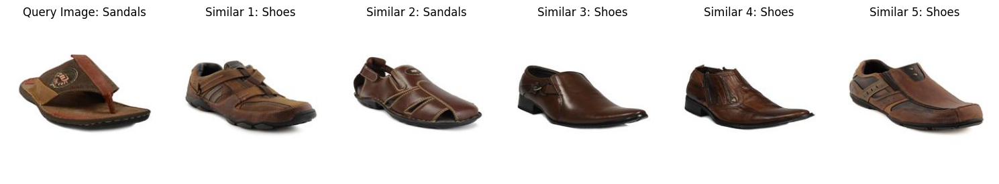

Query Image:
Top Similar Images:


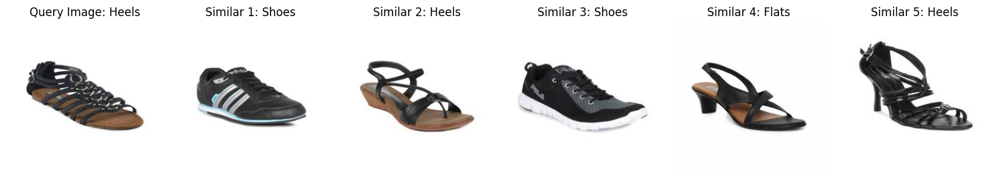

Query Image:
Top Similar Images:


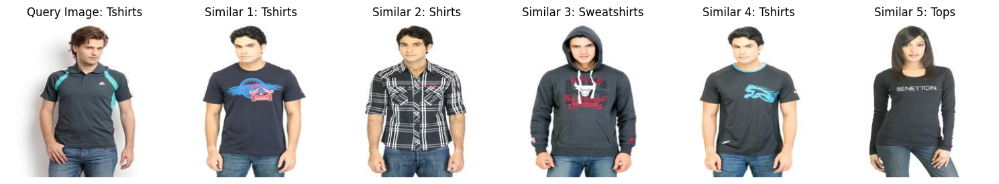

Query Image:
Top Similar Images:


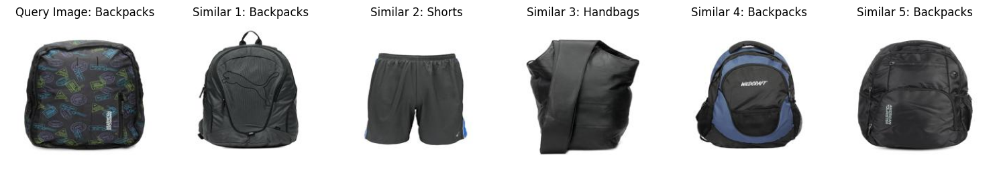

Query Image:
Top Similar Images:


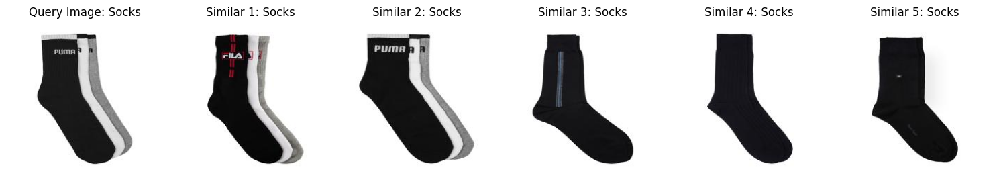

In [22]:
# Display results with color features
def display_similar_images_color(query_index, color_features, top_n=5):
    # Compute cosine similarity between query image and all others
    query_feature = color_features[query_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_feature, color_features).flatten()
    
    # Exclude the query image itself
    similarity_scores[query_index] = -1  # Set its similarity score to a very low value
    
    # Get indices of top N most similar images
    top_indices = np.argsort(similarity_scores)[-top_n:][::-1]

    display_images(top_indices, query_index)

for query_index in query_indices:
    display_similar_images_color(query_index, color_features_subblocks, top_n=5)


Query Image:
Top Similar Images:


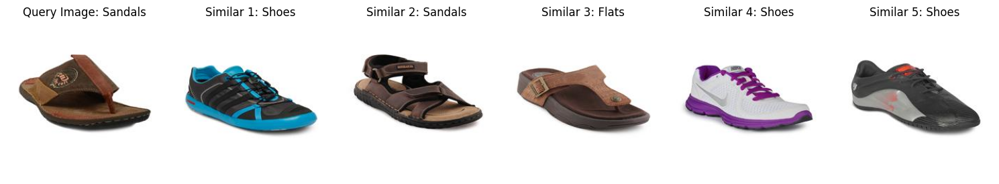

Query Image:
Top Similar Images:


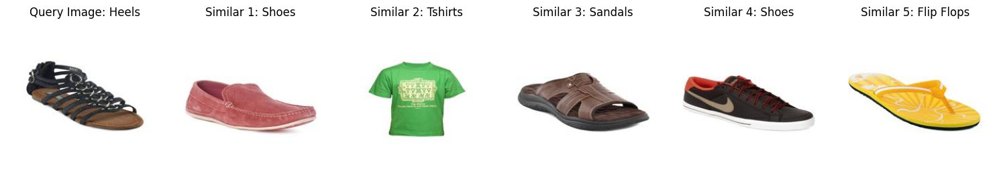

Query Image:
Top Similar Images:


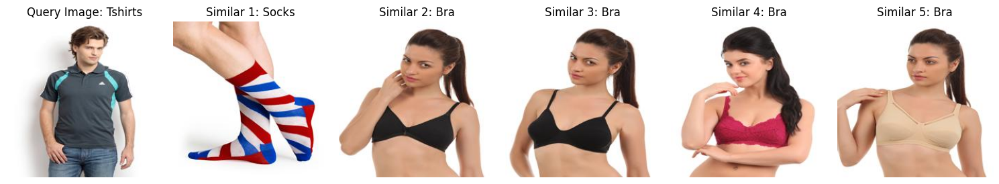

Query Image:
Top Similar Images:


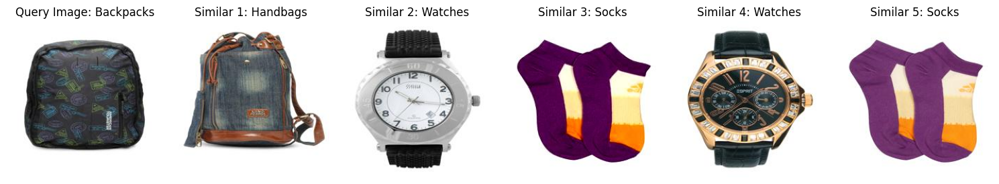

Query Image:
Top Similar Images:


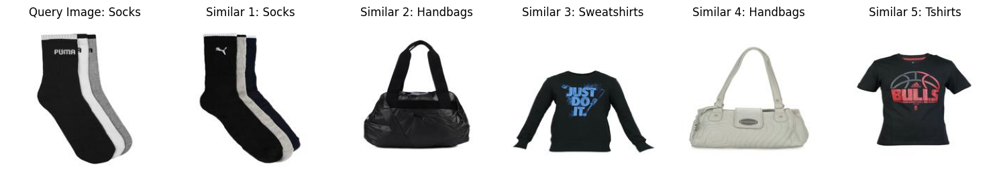

In [23]:
# Display results with texture features
def display_similar_images_texture(query_index, texture_features, top_n=5):
    # Compute cosine similarity between query image and all others
    query_feature = texture_features[query_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_feature, texture_features).flatten()
    
    # Exclude the query image itself
    similarity_scores[query_index] = -1  # Set its similarity score to a very low value
    
    # Get indices of top N most similar images
    top_indices = np.argsort(similarity_scores)[-top_n:][::-1]
    
    display_images(top_indices, query_index)

for query_index in query_indices:
    display_similar_images_texture(query_index, texture_features, top_n=5)

Query Image:
Top Similar Images:


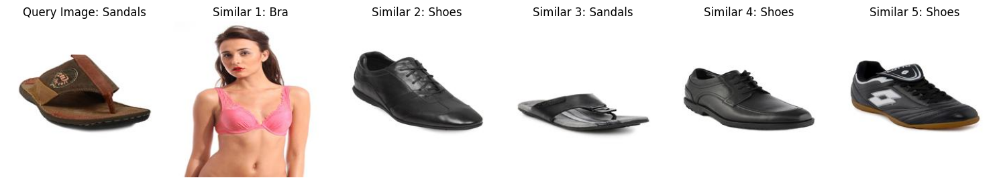

Query Image:
Top Similar Images:


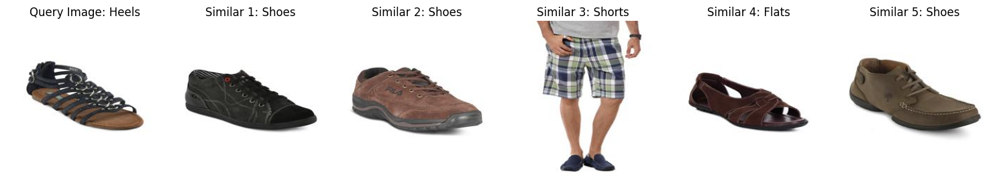

Query Image:
Top Similar Images:


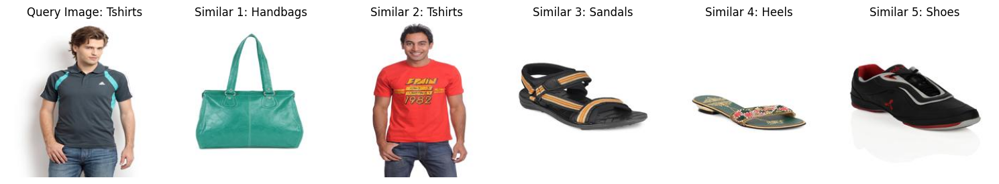

Query Image:
Top Similar Images:


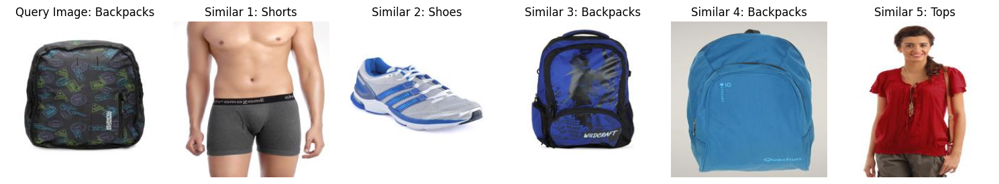

Query Image:
Top Similar Images:


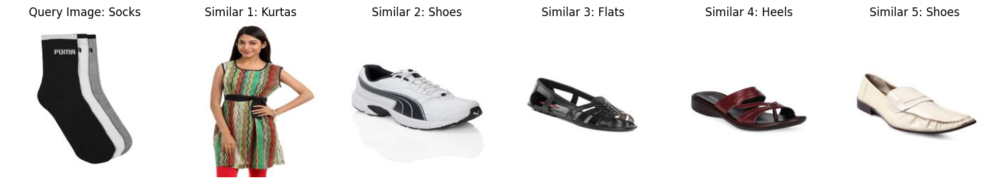

In [24]:
# Display results with shape features (Fourier descriptors)
def display_similar_images_shape(query_index, shape_features, top_n=5):
    # Compute cosine similarity between query image and all others
    query_feature = shape_features[query_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_feature, shape_features).flatten()
    
    # Exclude the query image itself
    similarity_scores[query_index] = -1  # Set its similarity score to a very low value
    
    # Get indices of top N most similar images
    top_indices = np.argsort(similarity_scores)[-top_n:][::-1]

    # Call the existing function to display images
    display_images(top_indices, query_index)

for query_index in query_indices:
    display_similar_images_shape(query_index, shape_features, top_n=5)

Query Image:
Top Similar Images:


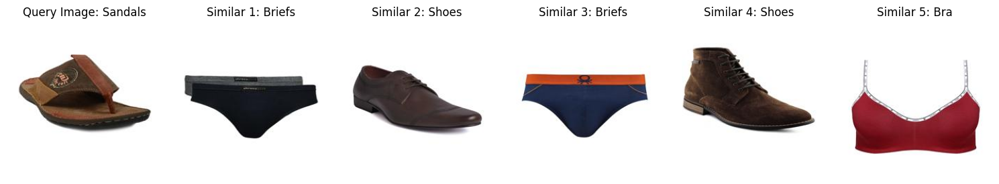

Query Image:
Top Similar Images:


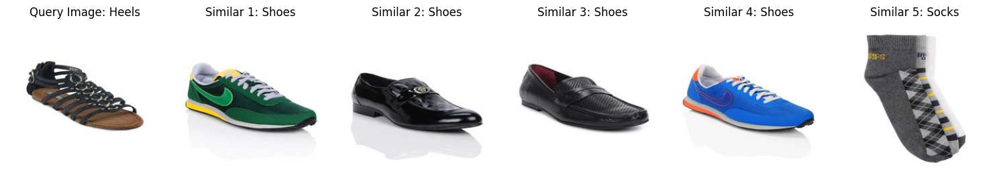

Query Image:
Top Similar Images:


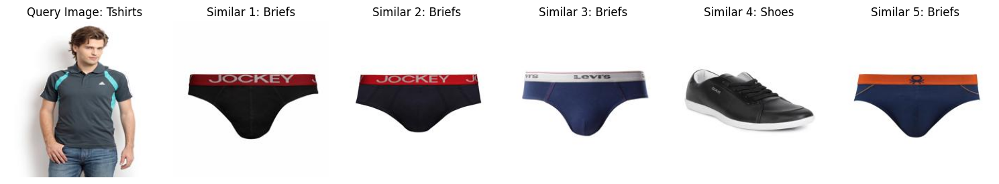

Query Image:
Top Similar Images:


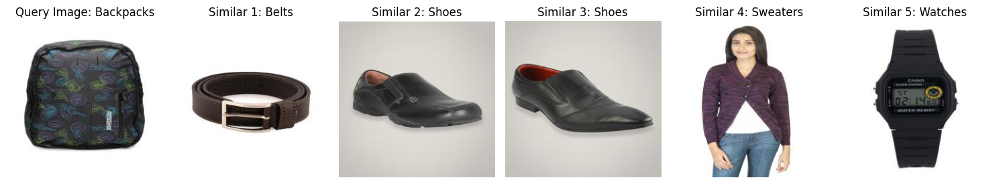

Query Image:
Top Similar Images:


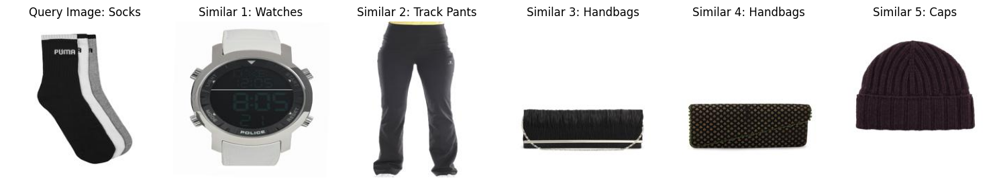

In [25]:
# Display results with ORB shape features
def display_similar_images_orb(query_index, shape_features, top_n=5):
    # Compute cosine similarity between query image and all others
    query_feature = shape_features[query_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_feature, shape_features).flatten()
    
    # Exclude the query image itself
    similarity_scores[query_index] = -1  # Set its similarity score to a very low value
    
    # Get indices of top N most similar images
    top_indices = np.argsort(similarity_scores)[-top_n:][::-1]

    # Call the existing function to display images
    display_images(top_indices, query_index)

for query_index in query_indices:
    display_similar_images_orb(query_index, shape_features_orb, top_n=5)

In [26]:
# Assign weights to each label
label_weights = {
    'gender': 0.15,
    'masterCategory': 0.15,
    'subCategory': 0.15,
    'articleType': 0.15,
    'baseColour': 0.25,
    'usage': 0.15
}

Query Image:
Top Similar Images:


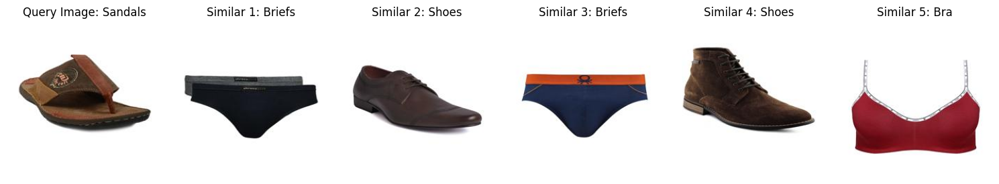

Query: 'Sandals' (Index: 38050)
[Normalized] Weighted Precision@5: 0.4000
[Normalized] NDCG@5: 0.3225
--------------------------------------------------
Query Image:
Top Similar Images:


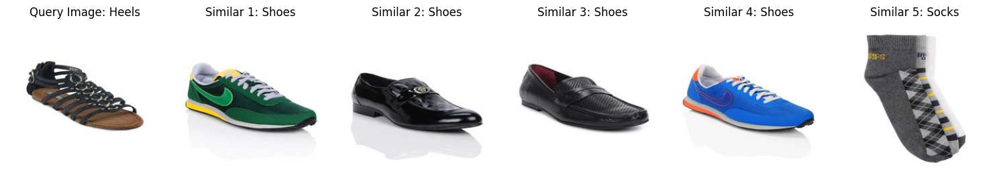

Query: 'Heels' (Index: 6862)
[Normalized] Weighted Precision@5: 0.4100
[Normalized] NDCG@5: 0.3413
--------------------------------------------------
Query Image:
Top Similar Images:


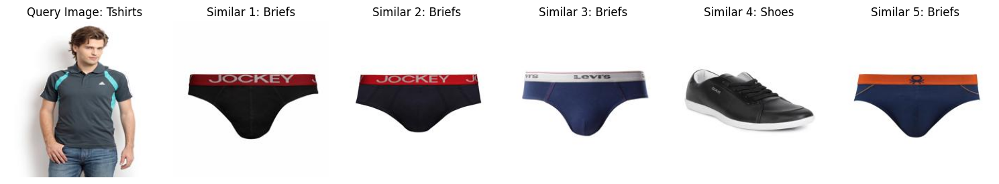

Query: 'Tshirts' (Index: 22920)
[Normalized] Weighted Precision@5: 0.4200
[Normalized] NDCG@5: 0.3463
--------------------------------------------------
Query Image:
Top Similar Images:


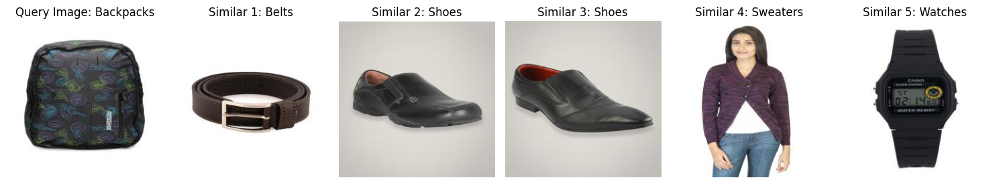

Query: 'Backpacks' (Index: 12554)
[Normalized] Weighted Precision@5: 0.3300
[Normalized] NDCG@5: 0.2500
--------------------------------------------------
Query Image:
Top Similar Images:


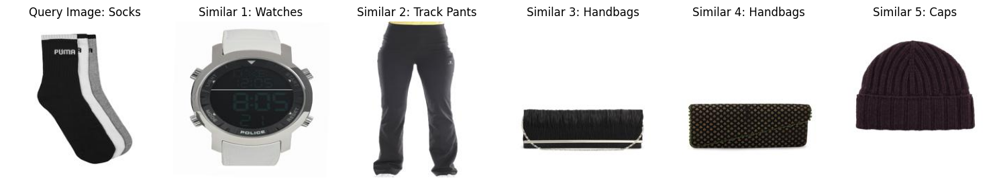

Query: 'Socks' (Index: 25269)
[Normalized] Weighted Precision@5: 0.3800
[Normalized] NDCG@5: 0.3562
--------------------------------------------------


In [27]:
def get_weighted_relevance(query_labels, retrieved_labels, label_weights):
    total_score = 0.0
    for col, w in label_weights.items():
        if query_labels[col] == retrieved_labels[col]:
            total_score += w
        else:
            total_score += 0
    return total_score

def compute_dcg(relevance_scores, k):
    dcg = 0.0
    for i, rel in enumerate(relevance_scores[:k], start=1):
        dcg += (2.0**rel - 1.0) / math.log2(i + 1)
    return dcg

def compute_ndcg(top_k_relevances, ideal_relevances, k):
    dcg_k = compute_dcg(top_k_relevances, k)
    idcg_k = compute_dcg(ideal_relevances, k)
    if idcg_k == 0:
        return 0.0
    return dcg_k / idcg_k

def display_similar_images_combined(query_index, combined_features, top_n=5, normalize_scores=True):
    # 1. Similarity
    query_feature = combined_features[query_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_feature, combined_features).flatten()
    similarity_scores[query_index] = -1.0

    # 2. Top-K
    top_indices = np.argsort(similarity_scores)[-top_n:][::-1]
    
    # 3. Display
    display_images(top_indices, query_index)

    # 4. Query labels
    query_labels = styles.loc[query_index, [
        'gender','masterCategory','subCategory',
        'articleType','baseColour','usage'
    ]]

    # 5. Weighted Relevance for top-K
    top_k_relevances = []
    for idx in top_indices:
        retrieved_labels = styles.loc[idx, [
            'gender','masterCategory','subCategory',
            'articleType','baseColour','usage'
        ]]
        rel_score = get_weighted_relevance(query_labels, retrieved_labels, label_weights)
        top_k_relevances.append(rel_score)

    raw_precision_k = sum(top_k_relevances) / top_n

    # 6. Weighted Relevance for all items -> for iDCG
    all_relevances = []
    for i in range(len(styles)):
        retrieved_labels = styles.loc[i, [
            'gender','masterCategory','subCategory',
            'articleType','baseColour','usage'
        ]]
        rel_score = get_weighted_relevance(query_labels, retrieved_labels, label_weights)
        all_relevances.append(rel_score)

    ideal_relevances = sorted(all_relevances, reverse=True)
    ndcg_k = compute_ndcg(top_k_relevances, ideal_relevances, top_n)

    if normalize_scores:
        # Now min_score=0, max_score=sum_of_weights if all match.
        max_score = sum(label_weights.values())  # likely 1.0
        min_score = 0.0
        denominator = max_score - min_score  # should be sum_of_weights

        normalized_top_k = [
            (rel - min_score) / denominator
            for rel in top_k_relevances
        ]
        normalized_precision_k = sum(normalized_top_k) / top_n

        normalized_all = [(rel - min_score) / denominator for rel in all_relevances]
        normalized_ideal = sorted(normalized_all, reverse=True)
        normalized_ndcg_k = compute_ndcg(normalized_top_k, normalized_ideal, top_n)

        print(f"Query: '{query_labels['articleType']}' (Index: {query_index})")
        print(f"[Normalized] Weighted Precision@{top_n}: {normalized_precision_k:.4f}")
        print(f"[Normalized] NDCG@{top_n}: {normalized_ndcg_k:.4f}")
        print("-" * 50)
    else:
        print(f"Query: '{query_labels['articleType']}' (Index: {query_index})")
        print(f"Weighted Precision@{top_n} (un-normalized): {raw_precision_k:.4f}")
        print(f"NDCG@{top_n} (un-normalized): {ndcg_k:.4f}")
        print("-" * 50)


# Example usage:
for query_index in query_indices:
    display_similar_images_combined(
        query_index,
        combined_features,
        top_n=5,
        normalize_scores=True
    )

In [28]:
# weight_ranges = {
#     'gender': np.arange(0.1, 0.21, 0.1),
#     'masterCategory': np.arange(0.1, 0.26, 0.15),
#     'subCategory': np.arange(0.15, 0.31, 0.15),
#     'articleType': np.arange(0.1, 0.26, 0.15),
#     'baseColour': np.arange(0.1, 0.41, 0.15),
#     'usage': np.arange(0.1, 0.21, 0.1)
# }

# # 2. Generate all combos, then normalize each so sum=1
# weight_combinations = list(itertools.product(
#     weight_ranges['gender'],
#     weight_ranges['masterCategory'],
#     weight_ranges['subCategory'],
#     weight_ranges['articleType'],
#     weight_ranges['baseColour'],
#     weight_ranges['usage']
# ))

# normalized_combinations = [
#     tuple(w / sum(weights) for w in weights)
#     for weights in weight_combinations
# ]

# # 3. Partial relevance function => EXACT match => add weight, mismatch => add 0
# def get_weighted_relevance(query_labels, retrieved_labels, label_weights):
#     score = 0.0
#     for col, w in label_weights.items():
#         if query_labels[col] == retrieved_labels[col]:
#             score += w
#     return score

# # 4. DCG and NDCG for partial relevances
# def compute_dcg(relevances, k):
#     dcg = 0.0
#     for i, rel in enumerate(relevances[:k], start=1):
#         dcg += (2.0**rel - 1.0) / math.log2(i + 1)
#     return dcg

# def compute_ndcg(top_k_relevances, all_relevances, k):
#     """
#     NDCG@K = DCG@K / IDCG@K, each in [0,1] if rel<=1.
#     """
#     dcg_k = compute_dcg(top_k_relevances, k)
#     # Sort in descending order to get the ideal DCG
#     ideal_relevances = sorted(all_relevances, reverse=True)
#     idcg_k = compute_dcg(ideal_relevances, k)
#     if idcg_k == 0:
#         return 0.0
#     return dcg_k / idcg_k

# # 5. Tuning function => tries all normalized weights, uses partial Precision@K + NDCG@K
# def tune_weights_for_queries(
#     query_indices, 
#     combined_features,
#     top_n=5,
#     precision_weight=0.5
# ):
#     best_combination_results = {}
#     ndcg_weight = 1.0 - precision_weight

#     for query_index in query_indices:
#         print(f"Tuning weights for query index {query_index}...")

#         best_score = -1.0
#         best_weights = None

#         # A) Compute similarity to get top-K
#         query_feature = combined_features[query_index].reshape(1, -1)
#         similarity_scores = cosine_similarity(query_feature, combined_features).flatten()
#         similarity_scores[query_index] = -1.0  # exclude self
#         top_indices = np.argsort(similarity_scores)[-top_n:][::-1]

#         # B) Query labels
#         query_labels = styles.loc[query_index, [
#             'gender','masterCategory','subCategory',
#             'articleType','baseColour','usage'
#         ]]

#         # C) Precompute all items' labels => for NDCG
#         all_labels = styles.loc[:, [
#             'gender','masterCategory','subCategory',
#             'articleType','baseColour','usage'
#         ]].values

#         # Build a parallel list: index + label dict
#         all_relevances_list = []
#         for idx, row_labels in enumerate(all_labels):
#             label_dict = {
#                 'gender':        row_labels[0],
#                 'masterCategory':row_labels[1],
#                 'subCategory':   row_labels[2],
#                 'articleType':   row_labels[3],
#                 'baseColour':    row_labels[4],
#                 'usage':         row_labels[5]
#             }
#             all_relevances_list.append((idx, label_dict))

#         # D) Try all normalized_combinations
#         for weights in normalized_combinations:
#             label_weights = {
#                 'gender':        weights[0],
#                 'masterCategory':weights[1],
#                 'subCategory':   weights[2],
#                 'articleType':   weights[3],
#                 'baseColour':    weights[4],
#                 'usage':         weights[5]
#             }

#             # 1) top-K relevances
#             top_k_relevances = []
#             for idx in top_indices:
#                 rel_score = get_weighted_relevance(query_labels,
#                                                    all_relevances_list[idx][1],
#                                                    label_weights)
#                 top_k_relevances.append(rel_score)

#             # partial Precision@K = avg of top_k_relevances
#             precision_k = sum(top_k_relevances) / top_n  # in [0,1]

#             # 2) all_relevances => for NDCG
#             item_relevances = []
#             for (idx, lbl_dict) in all_relevances_list:
#                 item_relevances.append(
#                     get_weighted_relevance(query_labels, lbl_dict, label_weights)
#                 )

#             ndcg_k = compute_ndcg(top_k_relevances, item_relevances, top_n) 

#             score = precision_weight * precision_k + ndcg_weight * ndcg_k

#             if score > best_score:
#                 best_score = score
#                 best_weights = label_weights

#         best_combination_results[query_index] = {
#             'best_score': best_score,
#             'best_weights': best_weights
#         }

#         # Print
#         print(f"Best weights for query index {query_index}: {best_weights}")
#         print(f"Combined Score [Precision@K * {precision_weight:.2f} + NDCG@K * {ndcg_weight:.2f}]: {best_score:.4f}\n")

#     return best_combination_results

# tune_query_indices = np.random.choice(len(styles), size=25, replace=False)
# best_results = tune_weights_for_queries(
#     query_indices=tune_query_indices,
#     combined_features=combined_features,
#     top_n=5,
#     precision_weight=0.5
# )

# for q_idx, info in best_results.items():
#     print(f"Query Index: {q_idx}")
#     print(f"Best Weights: {info['best_weights']}")
#     print(f"Best Score: {info['best_score']:.4f}")
#     print("-" * 50)

In [29]:
# def get_overall_best_weights(best_results):
#     best_overall_score = -float("inf")
#     best_overall_weights = None

#     for query_index, result in best_results.items():
#         score = result['best_score']
#         weights = result['best_weights']

#         if score > best_overall_score:
#             best_overall_score = score
#             best_overall_weights = weights

#     return best_overall_weights

# # Get the overall best weights
# best_weight = get_overall_best_weights(best_results)

# # Assign the best weights to label_weights
# label_weights = best_weight

# # Print the best weights
# print("Best Weights for Labels:")
# print(label_weights)

In [30]:
# # Assign best weights to each label
label_weights = {
    'gender': 0.1,
    'masterCategory': 0.1,
    'subCategory': 0.3,
    'articleType': 0.2,
    'baseColour': 0.2,
    'usage': 0.1
}

Query Image:
Top Similar Images:


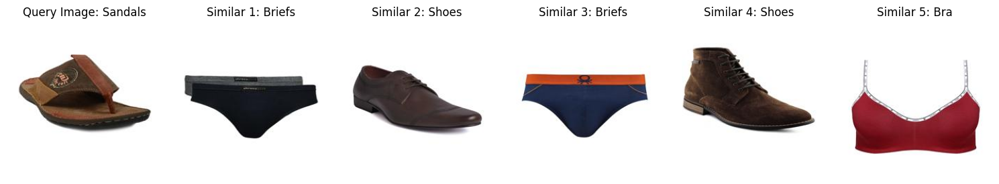

Query: 'Sandals' (Index: 38050)
[Normalized] Weighted Precision@5: 0.2800
[Normalized] NDCG@5: 0.2139
--------------------------------------------------
Query Image:
Top Similar Images:


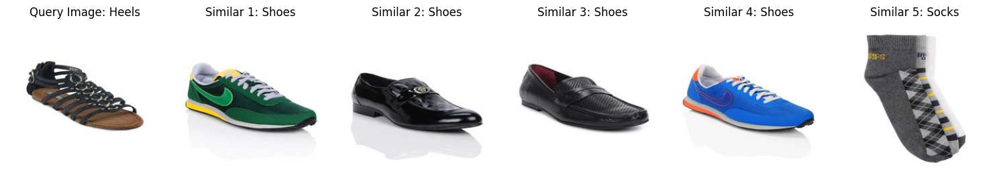

Query: 'Heels' (Index: 6862)
[Normalized] Weighted Precision@5: 0.4400
[Normalized] NDCG@5: 0.3797
--------------------------------------------------
Query Image:
Top Similar Images:


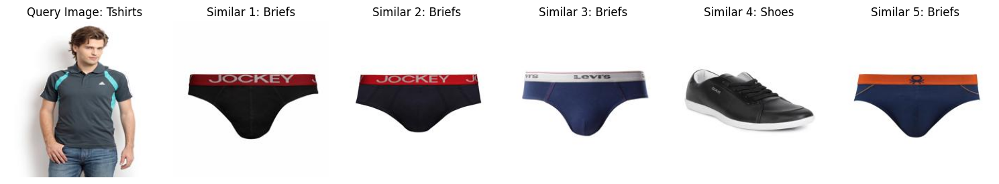

Query: 'Tshirts' (Index: 22920)
[Normalized] Weighted Precision@5: 0.2800
[Normalized] NDCG@5: 0.2191
--------------------------------------------------
Query Image:
Top Similar Images:


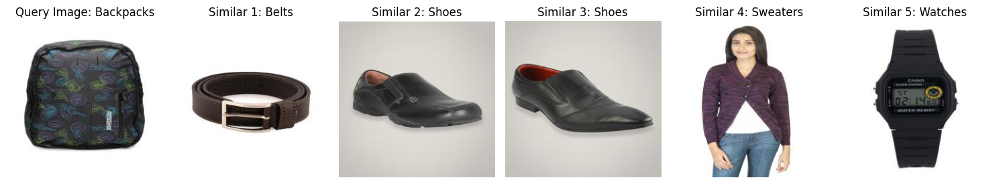

Query: 'Backpacks' (Index: 12554)
[Normalized] Weighted Precision@5: 0.2400
[Normalized] NDCG@5: 0.1739
--------------------------------------------------
Query Image:
Top Similar Images:


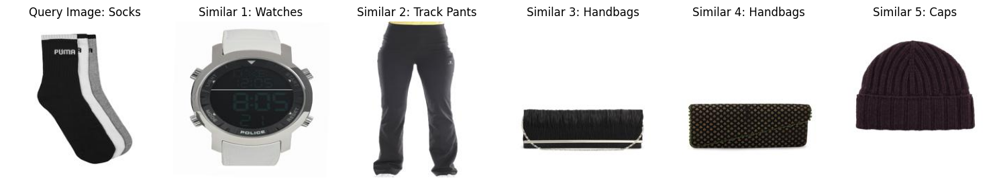

Query: 'Socks' (Index: 25269)
[Normalized] Weighted Precision@5: 0.2600
[Normalized] NDCG@5: 0.2331
--------------------------------------------------


In [31]:
for query_index in query_indices:
    display_similar_images_combined(query_index, combined_features, top_n=5)

In [32]:
# # Define finer ranges for each feature weight with smaller stepping
# feature_weight_ranges = {
#     'color': np.arange(0.2, 0.81, 0.2),
#     'texture': np.arange(0.15, 0.46, 0.15),
#     'shape': np.arange(0.0, 0.21, 0.1),
#     'shape_orb': np.arange(0.0, 0.21, 0.1)
# }

# # Generate all combinations of weights for each feature
# feature_weight_combinations = list(itertools.product(
#     feature_weight_ranges['color'],
#     feature_weight_ranges['texture'],
#     feature_weight_ranges['shape'],
#     feature_weight_ranges['shape_orb']
# ))

# # Filter combinations to ensure weights sum to 1
# feature_weight_combinations = [
#     weights for weights in feature_weight_combinations if np.isclose(sum(weights), 1.0)
# ]

# def tune_combined_features_with_weight_stepping(
#     query_indices, 
#     color_features, 
#     texture_features, 
#     shape_features, 
#     shape_features_orb, 
#     label_weights,
#     top_n=5, 
#     precision_weight=0.5
# ):
#     ndcg_weight = 1.0 - precision_weight
#     best_combination = None
#     best_score = -1.0

#     for weights in feature_weight_combinations:
#         color_weight, texture_weight, shape_weight, shape_orb_weight = weights

#         # (A) Combine features with current weights
#         combined_features = combine_features(
#             color_features, texture_features, shape_features, shape_features_orb,
#             color_weight, texture_weight, shape_weight, shape_orb_weight
#         )

#         # Track sums for computing average across queries
#         sum_precision = 0.0
#         sum_ndcg = 0.0

#         for query_index in query_indices:
#             # 1) Similarity => top-K
#             query_feature = combined_features[query_index].reshape(1, -1)
#             similarity_scores = cosine_similarity(query_feature, combined_features).flatten()
#             similarity_scores[query_index] = -1.0
#             top_indices = np.argsort(similarity_scores)[-top_n:][::-1]

#             # 2) Query labels
#             query_labels = styles.loc[query_index, [
#                 'gender', 'masterCategory', 'subCategory', 
#                 'articleType', 'baseColour', 'usage'
#             ]]

#             # 3) Compute partial relevance for top-K items
#             top_k_relevances = []
#             for idx in top_indices:
#                 retrieved_labels = styles.loc[idx, [
#                     'gender', 'masterCategory', 'subCategory', 
#                     'articleType', 'baseColour', 'usage'
#                 ]]
#                 rel_score = get_weighted_relevance(query_labels, retrieved_labels, label_weights)
#                 top_k_relevances.append(rel_score)

#             # partial Precision@K = average of top_k_relevances
#             precision_k = sum(top_k_relevances) / top_n

#             # 4) For NDCG, we need partial relevance for *all* items
#             all_relevances = []
#             for idx2 in range(len(styles)):
#                 retrieved_labels2 = styles.loc[idx2, [
#                     'gender', 'masterCategory', 'subCategory',
#                     'articleType', 'baseColour', 'usage'
#                 ]]
#                 score2 = get_weighted_relevance(query_labels, retrieved_labels2, label_weights)
#                 all_relevances.append(score2)

#             ndcg_k = compute_ndcg(top_k_relevances, all_relevances, top_n)

#             sum_precision += precision_k
#             sum_ndcg += ndcg_k

#         # (B) Average across all queries
#         avg_precision = sum_precision / len(query_indices)
#         avg_ndcg = sum_ndcg / len(query_indices)

#         # (C) Weighted final score
#         score = precision_weight * avg_precision + ndcg_weight * avg_ndcg

#         # (D) Update best combo
#         if score > best_score:
#             best_score = score
#             best_combination = weights

#     return best_combination, best_score

# tune_query_indices = np.random.choice(len(styles), size=25, replace=False)

# best_feature_weights, best_feature_score = tune_combined_features_with_weight_stepping(
#     query_indices=tune_query_indices,
#     color_features=color_features_subblocks,
#     texture_features=texture_features,
#     shape_features=shape_features,
#     shape_features_orb=shape_features_orb,
#     label_weights=label_weights,
#     top_n=5,
#     precision_weight=0.5
# )

# print(f"Best Feature Weights: {best_feature_weights}")
# print(f"Best Combined Feature Score: {best_feature_score:.4f}")

In [33]:
# # Use the best weights to combine features
# combined_features_best = combine_features(
#     color_features_subblocks, 
#     texture_features, 
#     shape_features, 
#     shape_features_orb, 
#     color_weight=best_feature_weights[0], 
#     texture_weight=best_feature_weights[1], 
#     shape_weight=best_feature_weights[2], 
#     shape_orb_weight=best_feature_weights[3]
# )

# # Save the combined features to a file for later use
# np.save("combined_features_best.npy", combined_features_best)

# print("Feature combination with best weights complete. Combined features saved to 'combined_features_best.npy'.")

In [34]:
# Use the best weights to combine features
combined_features_best = combine_features(
    color_features_subblocks, 
    texture_features, 
    shape_features, 
    shape_features_orb, 
    color_weight=0.65, 
    texture_weight=0.3, 
    shape_weight=0.05, 
    shape_orb_weight=0.0
)

# Save the combined features to a file for later use
np.save("combined_features_best.npy", combined_features_best)

print("Feature combination with best weights complete. Combined features saved to 'combined_features_best.npy'.")

Feature combination with best weights complete. Combined features saved to 'combined_features_best.npy'.


Query Image:
Top Similar Images:


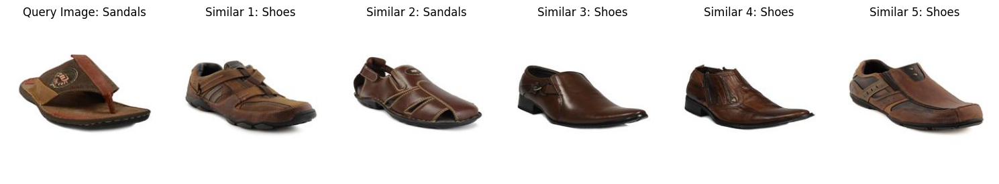

Query: 'Sandals' (Index: 38050)
[Normalized] Weighted Precision@5: 0.5400
[Normalized] NDCG@5: 0.4810
--------------------------------------------------
Query Image:
Top Similar Images:


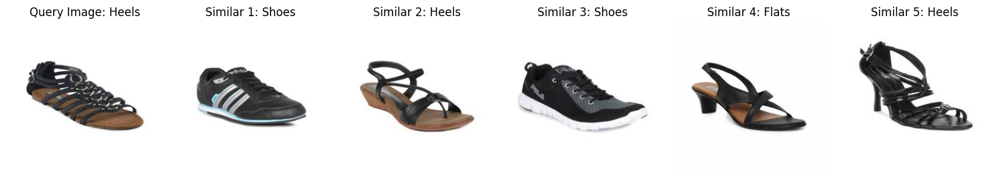

Query: 'Heels' (Index: 6862)
[Normalized] Weighted Precision@5: 0.6600
[Normalized] NDCG@5: 0.5763
--------------------------------------------------
Query Image:
Top Similar Images:


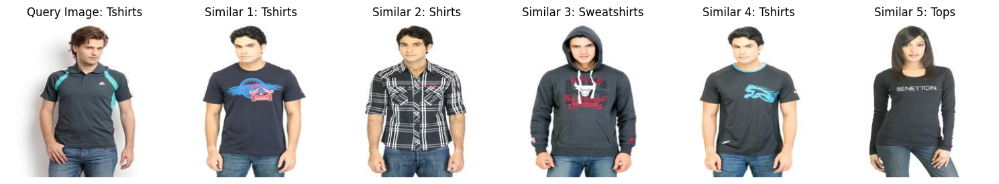

Query: 'Tshirts' (Index: 22920)
[Normalized] Weighted Precision@5: 0.6800
[Normalized] NDCG@5: 0.6330
--------------------------------------------------
Query Image:
Top Similar Images:


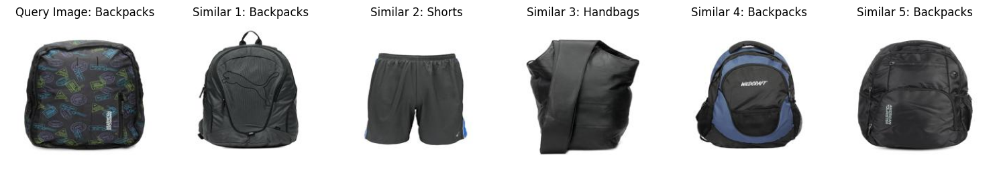

Query: 'Backpacks' (Index: 12554)
[Normalized] Weighted Precision@5: 0.6600
[Normalized] NDCG@5: 0.5967
--------------------------------------------------
Query Image:
Top Similar Images:


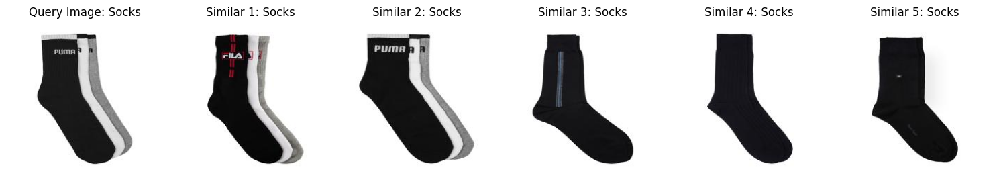

Query: 'Socks' (Index: 25269)
[Normalized] Weighted Precision@5: 0.8400
[Normalized] NDCG@5: 0.8219
--------------------------------------------------


In [35]:
for query_index in query_indices:
    display_similar_images_combined(query_index, combined_features_best, top_n=5)

Query Image:
Top Similar Images:


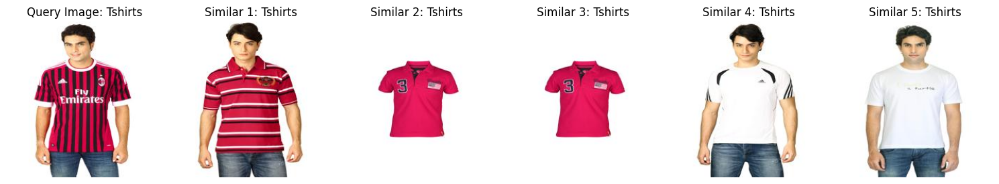

Query: 'Tshirts' (Index: 38625)
[Normalized] Weighted Precision@5: 0.8600
[Normalized] NDCG@5: 0.8598
--------------------------------------------------
Query Image:
Top Similar Images:


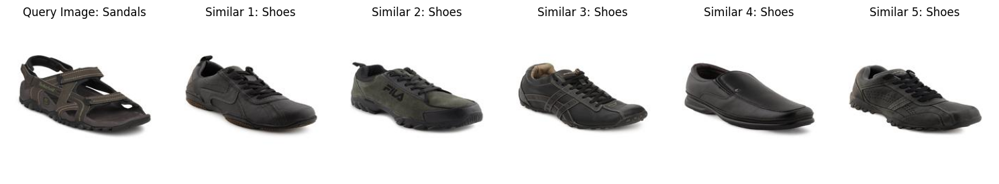

Query: 'Sandals' (Index: 36274)
[Normalized] Weighted Precision@5: 0.2800
[Normalized] NDCG@5: 0.2191
--------------------------------------------------
Query Image:
Top Similar Images:


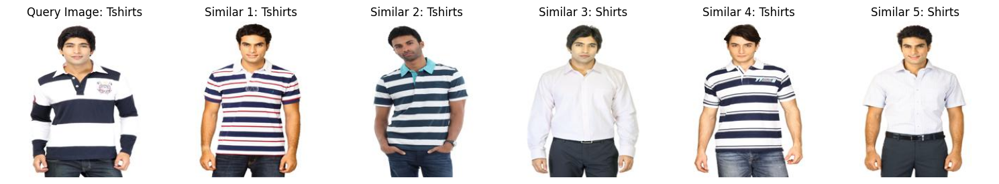

Query: 'Tshirts' (Index: 3934)
[Normalized] Weighted Precision@5: 0.7400
[Normalized] NDCG@5: 0.6978
--------------------------------------------------
Query Image:
Top Similar Images:


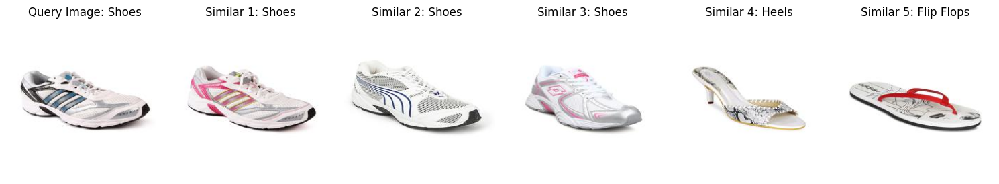

Query: 'Shoes' (Index: 38088)
[Normalized] Weighted Precision@5: 0.7400
[Normalized] NDCG@5: 0.7602
--------------------------------------------------
Query Image:
Top Similar Images:


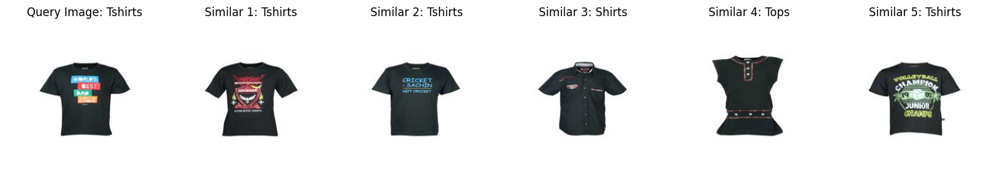

Query: 'Tshirts' (Index: 2079)
[Normalized] Weighted Precision@5: 0.8400
[Normalized] NDCG@5: 0.8185
--------------------------------------------------


In [36]:
final_query_indices = np.random.choice(len(styles), size=5, replace=False)

for final_query_index in final_query_indices:
    display_similar_images_combined(final_query_index, combined_features_best, top_n=5)

Query Image:
Top Similar Images:


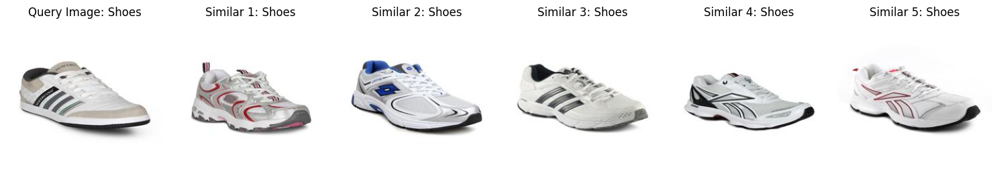

Query: 'Shoes' (Index: 28000)
[Normalized] Weighted Precision@5: 0.8400
[Normalized] NDCG@5: 0.7720
--------------------------------------------------


In [37]:
random_query_index = 28000
display_similar_images_combined(random_query_index, combined_features_best, top_n=5)

In [38]:
def display_similar_images_combined_score(final_query_indices, combined_features, top_n=5, normalize_scores=True):
    summ = 0
    count = 0
    for query_index in final_query_indices:
        query_feature = combined_features[query_index].reshape(1, -1)
        similarity_scores = cosine_similarity(query_feature, combined_features).flatten()
        similarity_scores[query_index] = -1.0

        # 2. Top-K
        top_indices = np.argsort(similarity_scores)[-top_n:][::-1]

        # 4. Query labels
        query_labels = styles.loc[query_index, [
            'gender','masterCategory','subCategory',
            'articleType','baseColour','usage'
        ]]

        # 5. Weighted Relevance for top-K
        top_k_relevances = []
        for idx in top_indices:
            retrieved_labels = styles.loc[idx, [
                'gender','masterCategory','subCategory',
                'articleType','baseColour','usage'
            ]]
            rel_score = get_weighted_relevance(query_labels, retrieved_labels, label_weights)
            top_k_relevances.append(rel_score)

        raw_precision_k = sum(top_k_relevances) / top_n

        # 6. Weighted Relevance for all items -> for iDCG
        all_relevances = []
        for i in range(len(styles)):
            retrieved_labels = styles.loc[i, [
                'gender','masterCategory','subCategory',
                'articleType','baseColour','usage'
            ]]
            rel_score = get_weighted_relevance(query_labels, retrieved_labels, label_weights)
            all_relevances.append(rel_score)

        ideal_relevances = sorted(all_relevances, reverse=True)
        ndcg_k = compute_ndcg(top_k_relevances, ideal_relevances, top_n)

        if normalize_scores:
            # Now min_score=0, max_score=sum_of_weights if all match.
            max_score = sum(label_weights.values())  # likely 1.0
            min_score = 0.0
            denominator = max_score - min_score  # should be sum_of_weights

            normalized_top_k = [
                (rel - min_score) / denominator
                for rel in top_k_relevances
            ]
            normalized_precision_k = sum(normalized_top_k) / top_n

            normalized_all = [(rel - min_score) / denominator for rel in all_relevances]
            normalized_ideal = sorted(normalized_all, reverse=True)
            normalized_ndcg_k = compute_ndcg(normalized_top_k, normalized_ideal, top_n)

            summ += normalized_ndcg_k
            count += 1
            print(count)
    print(summ / 100)

In [39]:
final_query_indices = np.random.choice(len(styles), size=100, replace=False)

display_similar_images_combined_score(final_query_indices, combined_features_best, top_n=5)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
0.7027455486525979


In [40]:
def suggest_label_for_query_image(query_index, combined_features, styles, top_n=10):

    # Compute cosine similarity between the query image and the dataset
    query_feature = combined_features[query_index].reshape(1, -1)
    similarity_scores = cosine_similarity(query_feature, combined_features).flatten()
    
    # Exclude the query image itself from results
    similarity_scores[query_index] = -1.0

    # Get the indices of the top N most similar images
    top_indices = np.argsort(similarity_scores)[-top_n:][::-1]
    
    # Label columns to consider
    label_columns = ['gender', 'masterCategory', 'subCategory', 'articleType', 'baseColour', 'usage']
    
    # Collect the labels of the top N most similar images
    top_labels_dict = {label: [] for label in label_columns}

    for idx in top_indices:
        for label in label_columns:
            top_labels_dict[label].append(styles.loc[idx, label])
    
    # Determine the most common label for each category
    most_common_labels = {}
    for label in label_columns:
        most_common_labels[label] = Counter(top_labels_dict[label]).most_common(1)[0][0]
    
    # Print results
    print(f"Query Image Index: {query_index}")
    
    return [most_common_labels[label] for label in label_columns]

Query Image:
Query Image Index: 10000


['Women', 'Footwear', 'Shoes', 'Heels', 'Gold', 'Casual']

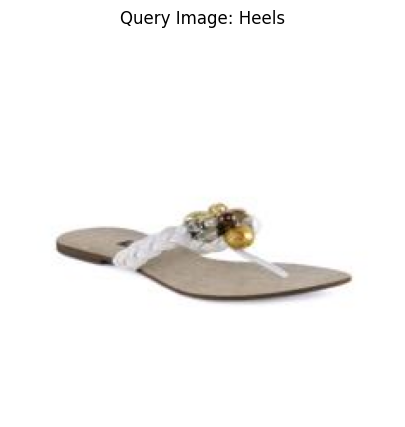

In [41]:
label_query_index = 10000
print("Query Image:")
query_image = cv2.imread(all_image_paths[label_query_index])
query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)  # Convert for displaying
query_label = styles.loc[label_query_index, 'articleType']
    
# Plot the query image
plt.figure(figsize=(15, 5))  # Adjust figure size
plt.imshow(query_image)
plt.axis('off')
plt.title(f"Query Image: {query_label}")
suggest_label_for_query_image(label_query_index, combined_features_best, styles)

Query Image:
Query Image Index: 20000


['Women', 'Accessories', 'Bags', 'Handbags', 'Brown', 'Casual']

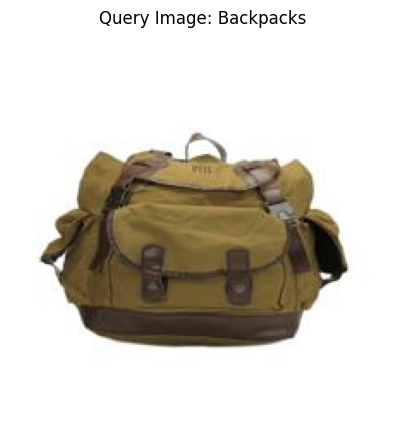

In [42]:
label_query_index = 20000
print("Query Image:")
query_image = cv2.imread(all_image_paths[label_query_index])
query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)  # Convert for displaying
query_label = styles.loc[label_query_index, 'articleType']
    
# Plot the query image
plt.figure(figsize=(15, 5))  # Adjust figure size
plt.imshow(query_image)
plt.axis('off')
plt.title(f"Query Image: {query_label}")
suggest_label_for_query_image(label_query_index, combined_features_best, styles)

Query Image:
Query Image Index: 30000


['Men', 'Footwear', 'Shoes', 'Shoes', 'Black', 'Casual']

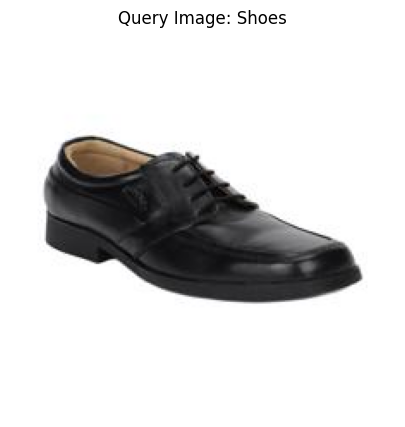

In [43]:
label_query_index = 30000
print("Query Image:")
query_image = cv2.imread(all_image_paths[label_query_index])
query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)  # Convert for displaying
query_label = styles.loc[label_query_index, 'articleType']
    
# Plot the query image
plt.figure(figsize=(15, 5))  # Adjust figure size
plt.imshow(query_image)
plt.axis('off')
plt.title(f"Query Image: {query_label}")
suggest_label_for_query_image(label_query_index, combined_features_best, styles)